In [1]:
import pandas as pd
import numpy as np
import h5py
import datetime
import matplotlib.pyplot as plt
from scipy import interpolate
file_name = "instrument_data_test2.h5"
h5_file = h5py.File(file_name, "r")

In [2]:
def create_list_of_datasets_in_h5file(h5_file):
    """
    Returns a list of the paths of all datasets in an h5 file.
    Can also be used to list all datasets under a given node (e.g., f['session001']).  In this case,
    the 'session001' is not included in the output paths.
    This comes from:
    https://stackoverflow.com/questions/44883175/how-to-list-all-datasets-in-h5py-file
    :param f:
    :return:
    """
    keys = []
    h5_file.visit(lambda key: keys.append(key) if type(h5_file[key]) is h5py._hl.dataset.Dataset else None)
    return keys


def create_list_of_groups_in_node(node):
    keys = []
    node.visit(lambda key: keys.append(key) if type(node[key]) is h5py._hl.group.Group else None)
    return keys

def create_list_of_items_in_node(item_type, h5_file, node):
    keys = []
    if item_type == "group":
        my_type = h5py._hl.group.Group
    if item_type == "dataset":
        my_type = h5py._hl.dataset.Dataset
    h5_file[node].visit(lambda key: keys.append(key) if type(h5_file[node][key]) is my_type else None)
    return keys

def create_list_of_insertions_in_node(h5_file, node):
    insertions = []
    all_groups = create_list_of_items_in_node("group", h5_file, node)
    for group in all_groups:
        if group[-6:-3] == 'ins':
            insertions.append(group)
    return insertions

def create_session_insertion_dict(h5_file):
    keys = list(h5_file.keys())
    key_dict = {}
    for key in keys:
        # session_number = int(key[-3:])
        key_dict[key] = create_list_of_insertions_in_node(h5_file, key)
    print(key_dict)
    return key_dict

def create_list_of_calibrations_in_node(h5_file, node):
    calibrations = []
    all_groups = create_list_of_items_in_node("group", h5_file, node)
    for group in all_groups:
        if group[-6:-3] == 'cal':
            calibrations.append(group)
    return calibrations


def create_session_calibration_dict(h5_file):
    keys = list(h5_file.keys())
    key_dict = {}
    for key in keys:
        key_dict[key] = create_list_of_calibrations_in_node(h5_file, key)
    print(key_dict)
    return key_dict

def get_wavelengths_vector(h5_file, session, insertion, spectrometer):
    if spectrometer == "spectrometer1":
        vector_attr = "spec1_wavelengths_vector"
    elif spectrometer == "spectrometer2":
        vector_attr = "spec2_wavelengths_vector"
    else:
        print("spectrometer not specified")
        vector_attr = ""

    insertion_group = h5_file[f"{session}/{insertion}"]
    wavelengths_vector = insertion_group.parent.attrs[vector_attr][:]
    return wavelengths_vector

def get_absorbance_spectra_in_insertion(h5_file, session, insertion):
    absorbance_string = "spectrometer1/derived/absorbances"
    absorbance_spectra = h5_file[f"{session}/{insertion}/{absorbance_string}"][:]
    print(absorbance_spectra)
    return absorbance_spectra

def get_absorbance_spectra_and_depth_in_insertion(h5_file, session, insertion):
    dset_string = "derived/absorbance_depth"
    dset = h5_file[f"{session}/{insertion}/{dset_string}"]
    absorbance_spectra = dset[:, :-2]
    depths = dset[:, -1]
    forces = dset[:, -2]
    print(absorbance_spectra)
    return absorbance_spectra, depths, forces

def get_current_time():
    return np.datetime64(datetime.datetime.now()).astype(np.int64)


def timestamp_list_to_pandas_timestamps(timestamp_list):
    series = pd.Series(timestamp_list).astype('<M8[us]')
    return series

In [3]:
inserts = create_list_of_insertions_in_node(h5_file, "session002")
inserts

['cal001/ins001',
 'cal001/ins002',
 'cal001/ins003',
 'cal001/ins004',
 'cal001/ins005',
 'cal001/ins006',
 'cal001/ins007',
 'cal001/ins008',
 'cal001/ins009',
 'cal001/ins010']

In [4]:
waves = h5_file['session002/cal001'].attrs['spec1_wavelengths_vector'][:]
waves

array([1550., 1551., 1552., 1553., 1554., 1555., 1556., 1557., 1558.,
       1559., 1560., 1561., 1562., 1563., 1564., 1565., 1566., 1567.,
       1568., 1569., 1570., 1571., 1572., 1573., 1574., 1575., 1576.,
       1577., 1578., 1579., 1580., 1581., 1582., 1583., 1584., 1585.,
       1586., 1587., 1588., 1589., 1590., 1591., 1592., 1593., 1594.,
       1595., 1596., 1597., 1598., 1599., 1600., 1601., 1602., 1603.,
       1604., 1605., 1606., 1607., 1608., 1609., 1610., 1611., 1612.,
       1613., 1614., 1615., 1616., 1617., 1618., 1619., 1620., 1621.,
       1622., 1623., 1624., 1625., 1626., 1627., 1628., 1629., 1630.,
       1631., 1632., 1633., 1634., 1635., 1636., 1637., 1638., 1639.,
       1640., 1641., 1642., 1643., 1644., 1645., 1646., 1647., 1648.,
       1649., 1650., 1651., 1652., 1653., 1654., 1655., 1656., 1657.,
       1658., 1659., 1660., 1661., 1662., 1663., 1664., 1665., 1666.,
       1667., 1668., 1669., 1670., 1671., 1672., 1673., 1674., 1675.,
       1676., 1677.,

In [5]:
cols = waves.tolist()
cols.append('force')
cols.append('depth')
cols

[1550.0,
 1551.0,
 1552.0,
 1553.0,
 1554.0,
 1555.0,
 1556.0,
 1557.0,
 1558.0,
 1559.0,
 1560.0,
 1561.0,
 1562.0,
 1563.0,
 1564.0,
 1565.0,
 1566.0,
 1567.0,
 1568.0,
 1569.0,
 1570.0,
 1571.0,
 1572.0,
 1573.0,
 1574.0,
 1575.0,
 1576.0,
 1577.0,
 1578.0,
 1579.0,
 1580.0,
 1581.0,
 1582.0,
 1583.0,
 1584.0,
 1585.0,
 1586.0,
 1587.0,
 1588.0,
 1589.0,
 1590.0,
 1591.0,
 1592.0,
 1593.0,
 1594.0,
 1595.0,
 1596.0,
 1597.0,
 1598.0,
 1599.0,
 1600.0,
 1601.0,
 1602.0,
 1603.0,
 1604.0,
 1605.0,
 1606.0,
 1607.0,
 1608.0,
 1609.0,
 1610.0,
 1611.0,
 1612.0,
 1613.0,
 1614.0,
 1615.0,
 1616.0,
 1617.0,
 1618.0,
 1619.0,
 1620.0,
 1621.0,
 1622.0,
 1623.0,
 1624.0,
 1625.0,
 1626.0,
 1627.0,
 1628.0,
 1629.0,
 1630.0,
 1631.0,
 1632.0,
 1633.0,
 1634.0,
 1635.0,
 1636.0,
 1637.0,
 1638.0,
 1639.0,
 1640.0,
 1641.0,
 1642.0,
 1643.0,
 1644.0,
 1645.0,
 1646.0,
 1647.0,
 1648.0,
 1649.0,
 1650.0,
 1651.0,
 1652.0,
 1653.0,
 1654.0,
 1655.0,
 1656.0,
 1657.0,
 1658.0,
 1659.0,
 1660.0,
 

In [6]:
dfs = []
for i in range(len(inserts)):
    df_name = f"df{i+1}"
    dfs.append(df_name)

In [7]:
absorb_str = 'derived/absorbance_depth'
for i in range(len(inserts)):
    dfs[i] = pd.DataFrame(data = h5_file[f'session002/{inserts[i]}/{absorb_str}'][:], columns=cols)

## Plot Absorbance spectra by insertion

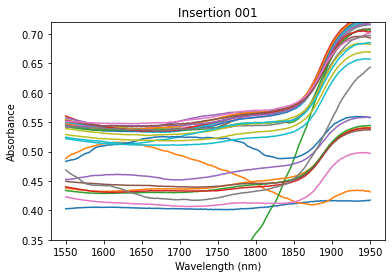

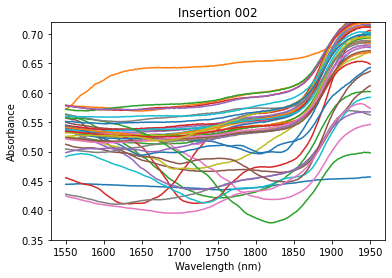

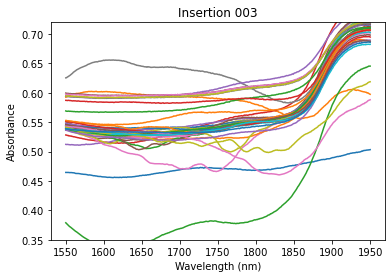

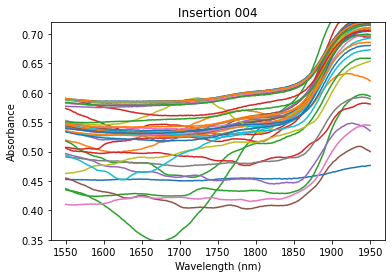

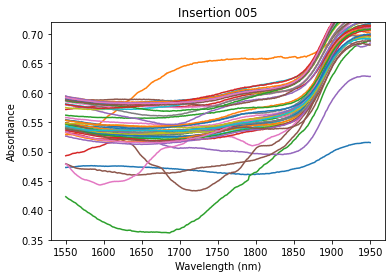

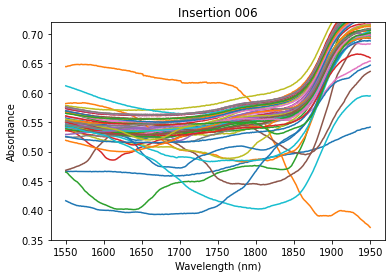

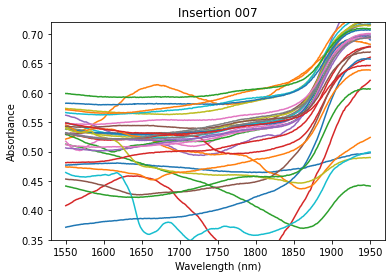

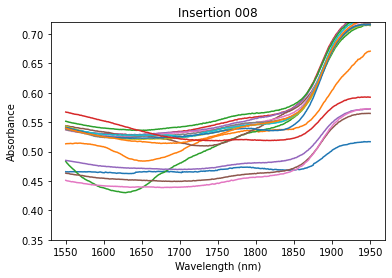

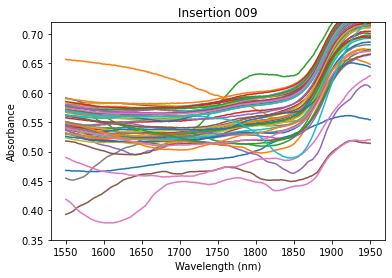

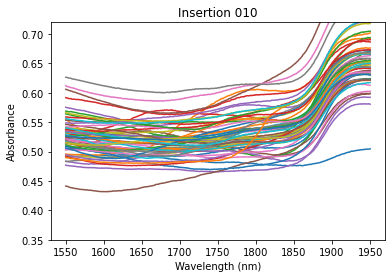

In [8]:
for i in range(len(dfs)):
    fig, ax = plt.subplots()
    ax.set_ylim(0.35, 0.72)
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    ax.set_title(f"Insertion {(i + 1):03d}")
    for spectrum in range(dfs[i].shape[0]):
        ax.plot(waves, dfs[i].iloc[spectrum, :-2])
    plt.show()

## Plot Force by Depth for each insertion

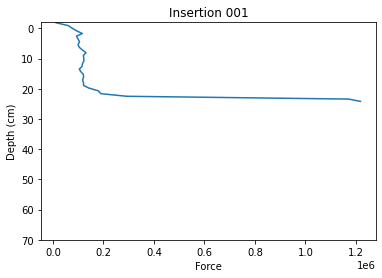

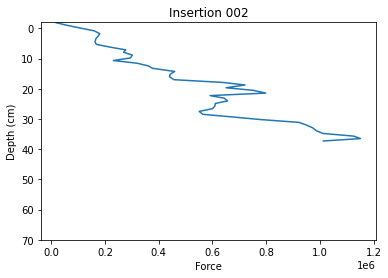

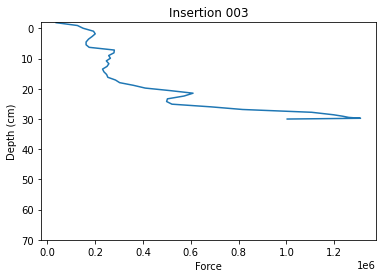

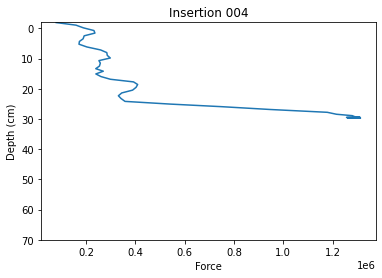

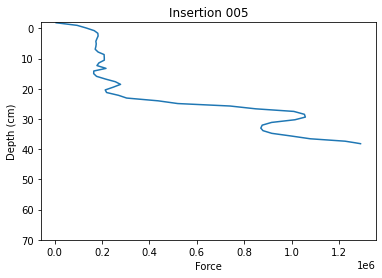

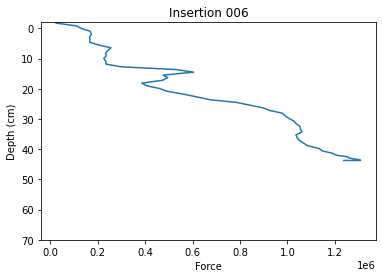

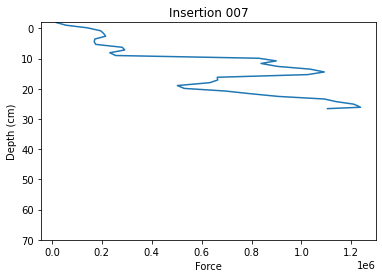

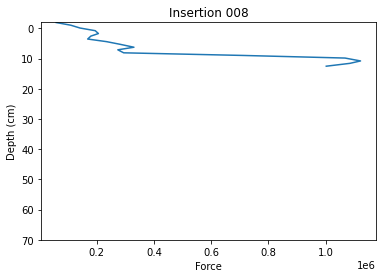

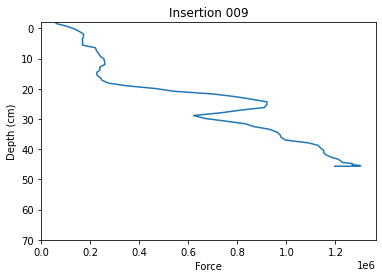

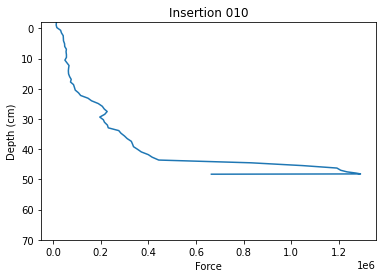

In [10]:
for i in range(len(dfs)):
    fig, ax = plt.subplots()
    ax.set_ylim(70.0, -2.0)
    ax.set_ylabel("Depth (cm)")
    ax.set_xlabel("Force")
    ax.set_title(f"Insertion {(i + 1):03d}")
    
    force = dfs[i].loc[:, "force"]
    
    depth = dfs[i].loc[:, "depth"]
    ax.plot(force, depth)

## Plot Absorbance by depth at four different wavelengths

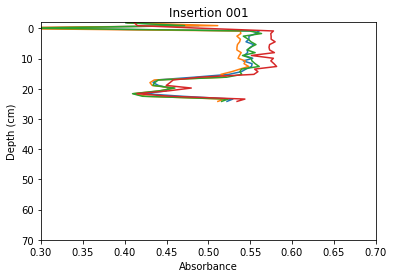

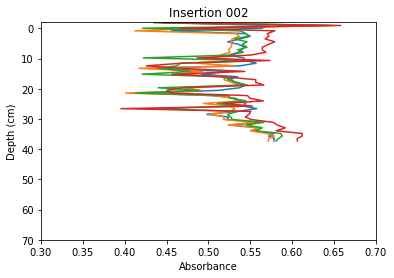

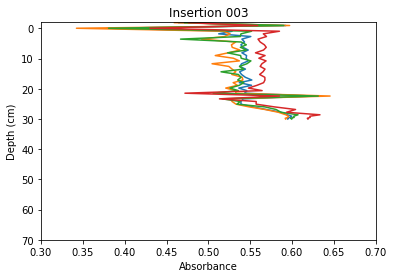

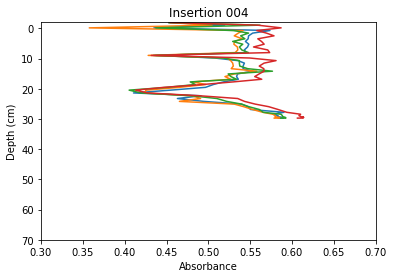

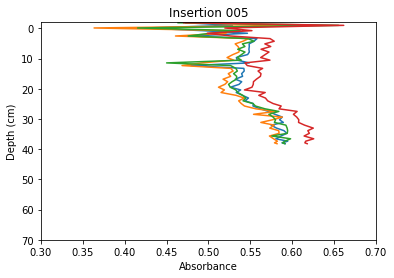

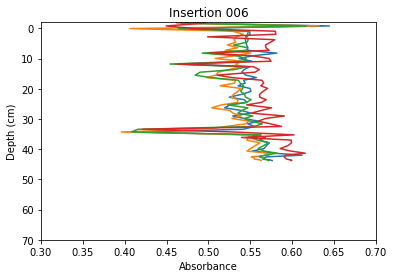

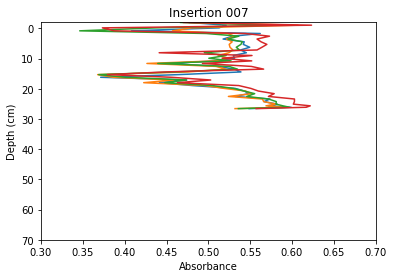

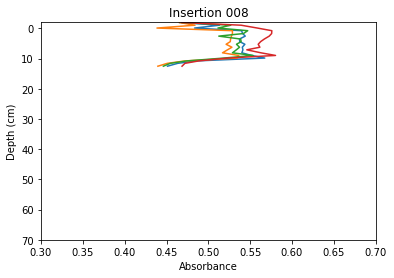

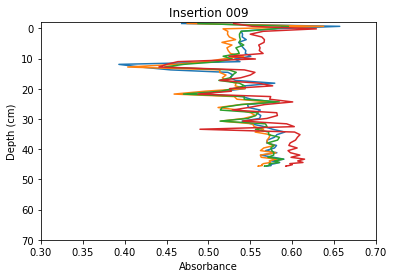

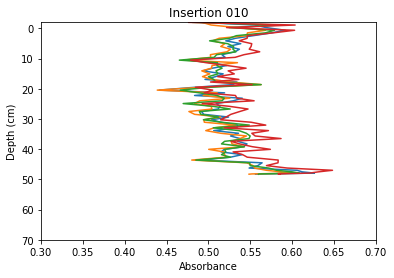

In [11]:
for i in range(len(dfs)):
    fig, ax = plt.subplots()
    ax.set_ylim(70.0, -2.0)
    ax.set_xlim(0.3, 0.7)
    ax.set_ylabel("Depth (cm)")
    ax.set_xlabel("Absorbance")
    ax.set_title(f"Insertion {(i + 1):03d}")
    abs1550 = dfs[i].loc[:, 1550.0]
    abs1650 = dfs[i].loc[:, 1650.0]
    abs1750 = dfs[i].loc[:, 1750.0]
    abs1850 = dfs[i].loc[:, 1850.0]
    depth = dfs[i].loc[:, "depth"]
    ax.plot(abs1550, depth)
    ax.plot(abs1650, depth)
    ax.plot(abs1750, depth)
    ax.plot(abs1850, depth)

## Plot Force by Absorbance at 1750 nm

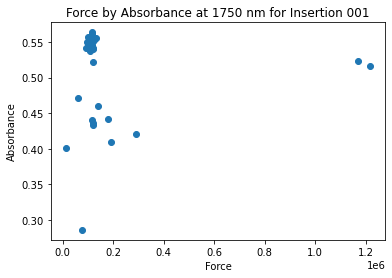

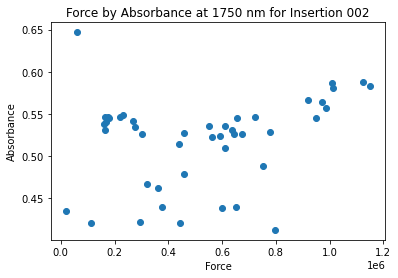

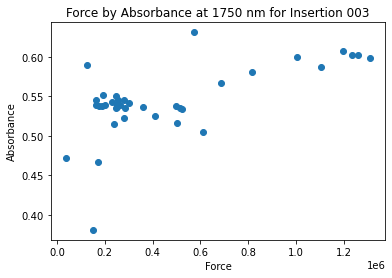

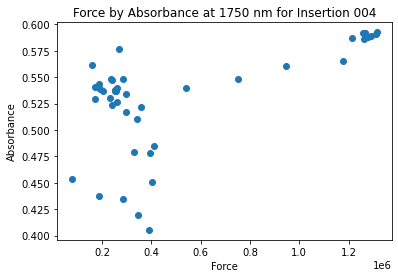

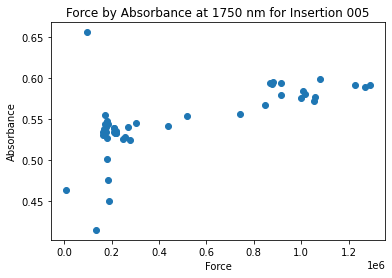

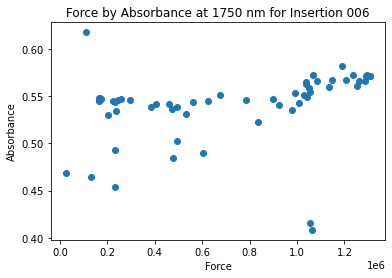

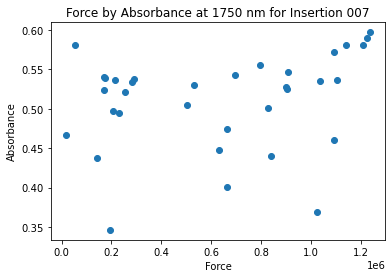

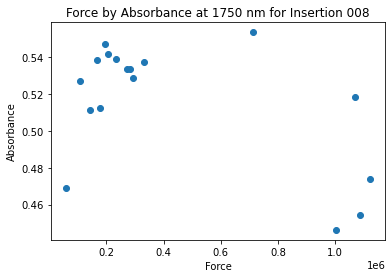

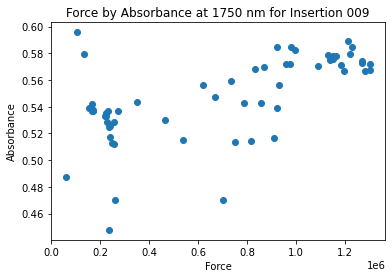

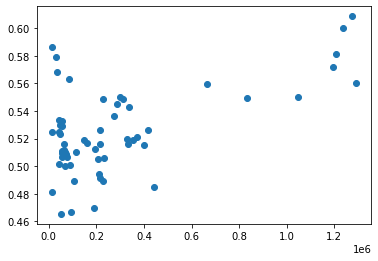

In [12]:
for i in range(len(dfs)):
    ax.set_title(f"Force by Absorbance at 1750 nm for Insertion {i:03d}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Force")
    force = dfs[i].loc[:, 'force']
    abs1750 = dfs[i].loc[:, 1750.0]
    fig, ax = plt.subplots()
    ax.plot(force, abs1750, 'o')

## Plot force by Absorbance at 1600 nm

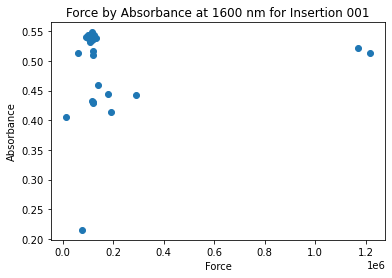

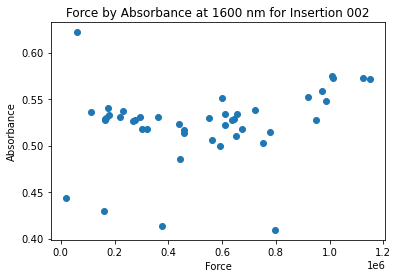

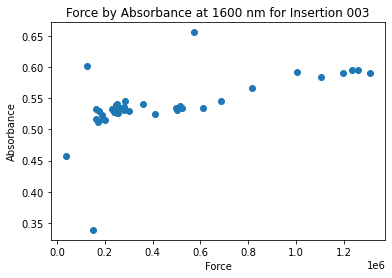

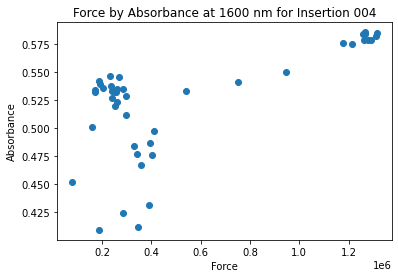

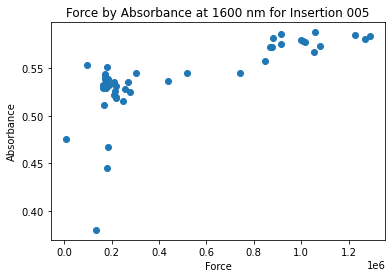

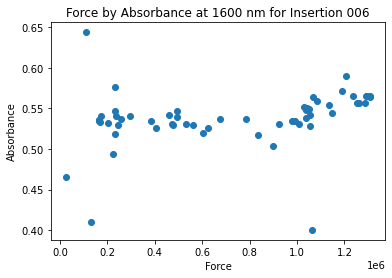

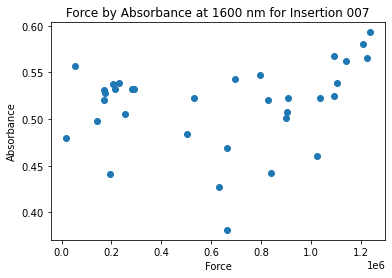

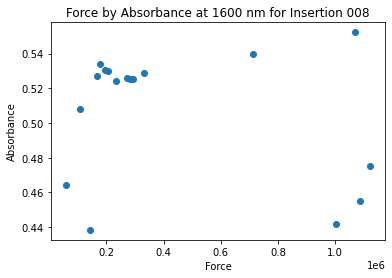

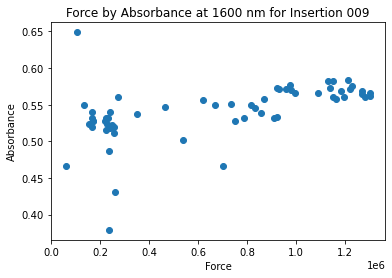

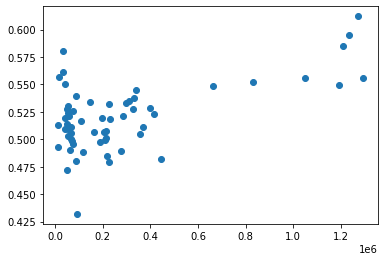

In [14]:
for i in range(len(dfs)):
    ax.set_title(f"Force by Absorbance at 1600 nm for Insertion {i:03d}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Force")
    force = dfs[i].loc[:, 'force']
    abs1750 = dfs[i].loc[:, 1600.0]
    fig, ax = plt.subplots()
    ax.plot(force, abs1750, 'o')

## Plot all individual absorbance spectra

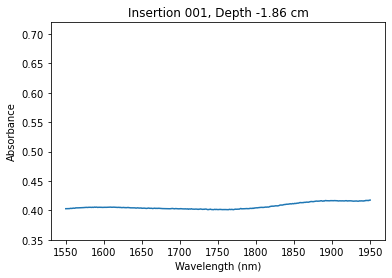

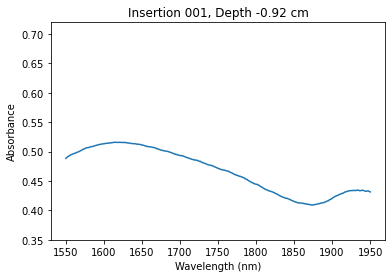

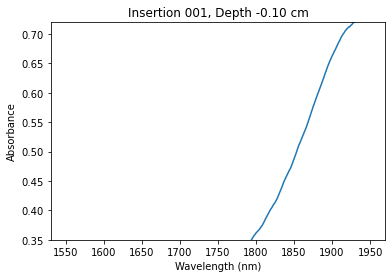

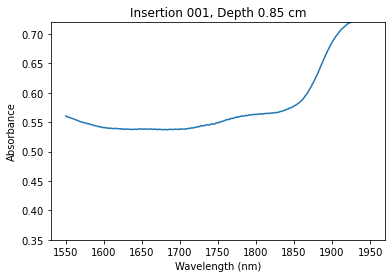

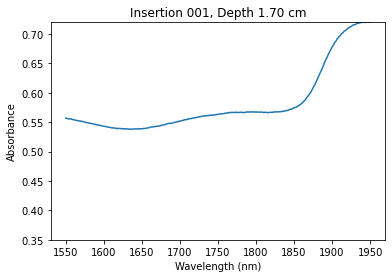

...

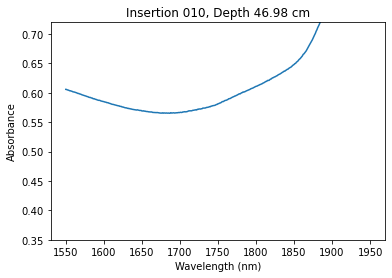

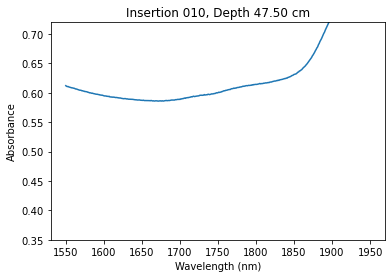

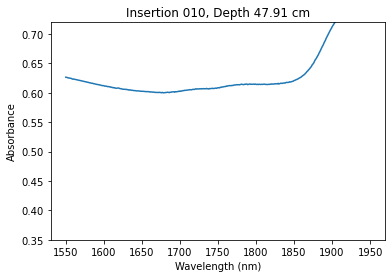

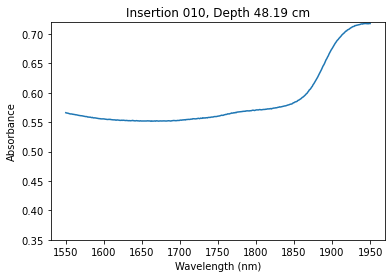

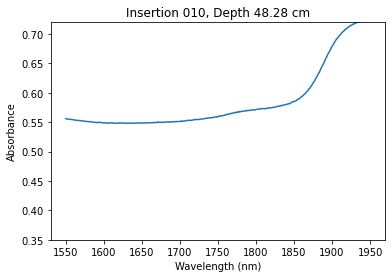

In [15]:
for i in range(len(dfs)):  
    for spectrum in range(dfs[i].shape[0]):
        fig, ax = plt.subplots()
        ax.set_ylim(0.35, 0.72)
        ax.set_ylabel("Absorbance")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_title(f"Insertion {(i + 1):03d}, Depth {dfs[i].iloc[spectrum, -1]:0.2f} cm")
        ax.plot(waves, dfs[i].iloc[spectrum, :-2])
        plt.show()

In [16]:
def find_zoomed_yvalues(wavelengths_vector, absorbance_spectrum):
    
    # get min_val, max_val of 1700 to 1800 nm
    mid_waves = (wavelengths_vector > 1700) & (wavelengths_vector < 1800)
    minval = absorbance_spectrum[mid_waves].min()
    maxval = absorbance_spectrum[mid_waves].max()
    ymin = minval - (minval * 0.005)
    ymax = maxval + (maxval * 0.005)
    return ymin, ymax


## Plot individual spectra zoomed to emphasize peaks between 1700 and 1800 nm

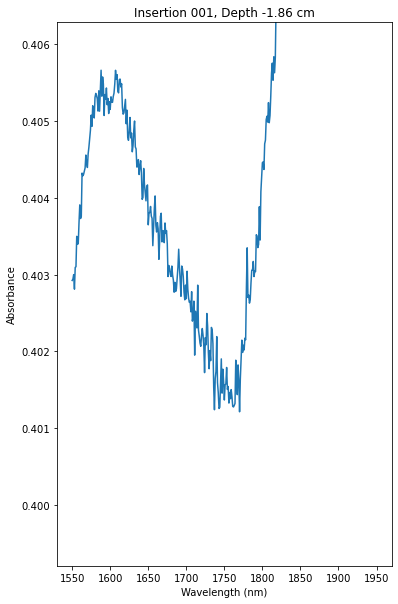

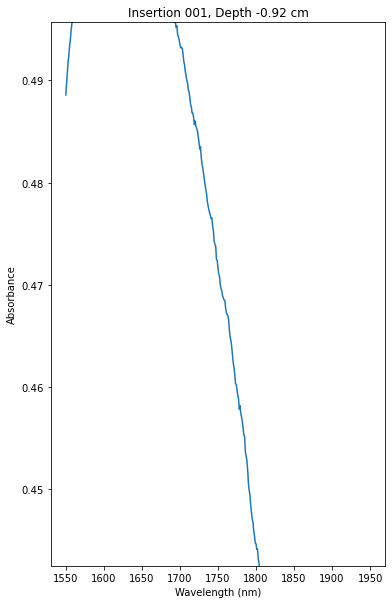

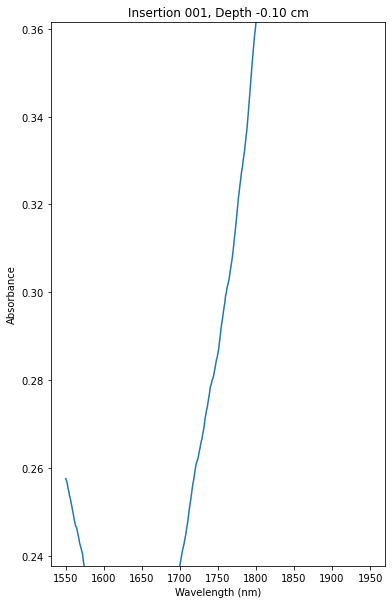

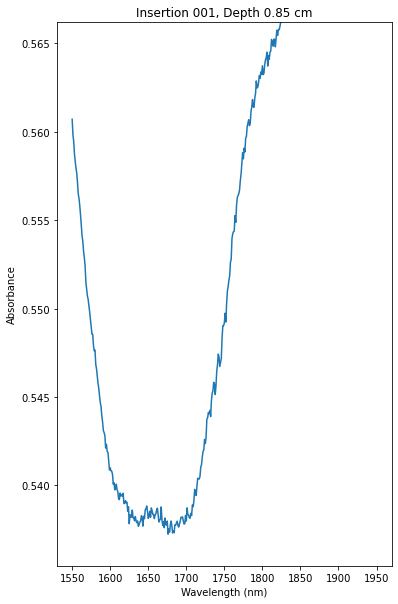

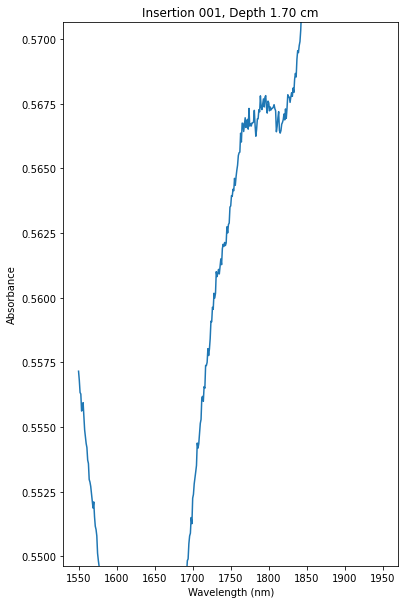

...

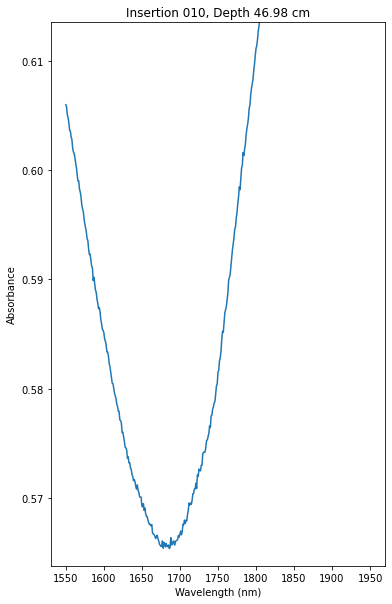

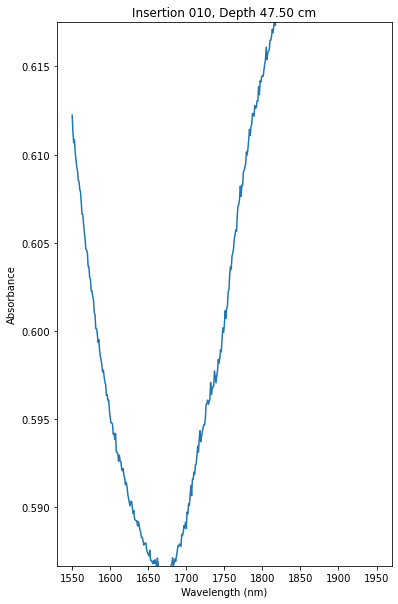

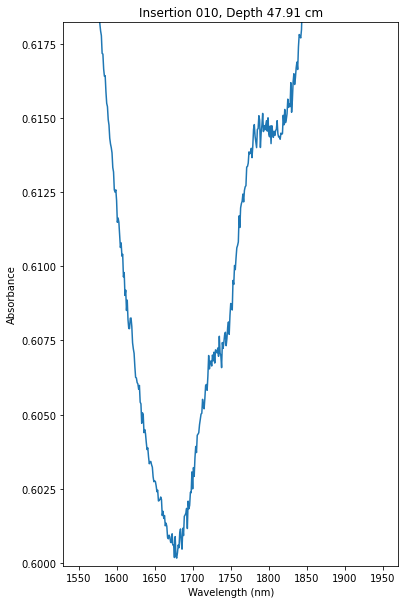

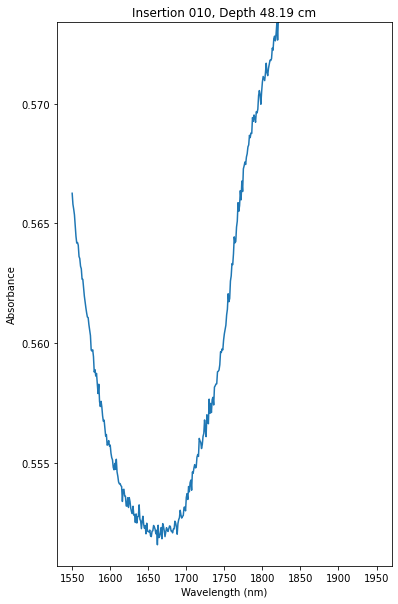

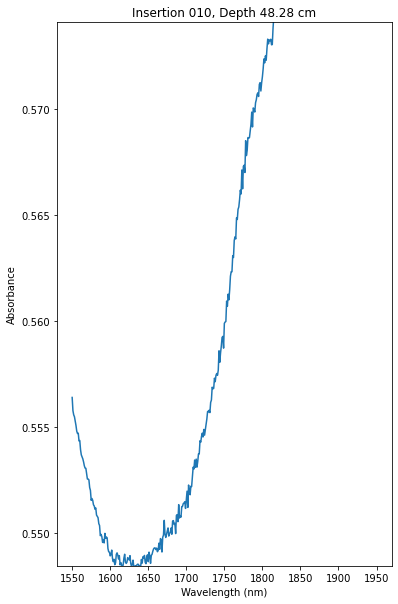

In [18]:
for i in range(len(dfs)):  
    for spectrum in range(dfs[i].shape[0]):
        absorb_spectrum = dfs[i].iloc[spectrum, :-2]
        ymin,ymax = find_zoomed_yvalues(waves, absorb_spectrum)
        fig, ax = plt.subplots(figsize=(6, 10))
        ax.set_ylim(ymin, ymax)
        ax.set_ylabel("Absorbance")
        ax.set_xlabel("Wavelength (nm)")
        ax.set_title(f"Insertion {(i + 1):03d}, Depth {dfs[i].iloc[spectrum, -1]:0.2f} cm")
        ax.plot(waves, absorb_spectrum)
        plt.show()

In [ ]:
encoder_depths_str = 'encoder/depths'
encoder_timestamps_str 'encoder/timestamps'